# Traffic congestion:

Traffic congestion constitutes a major challenge that must be addressed in urban environments to improve the quality of life for inhabitants.
Traffic congestion is measured based on several parameters such as delay, speed, length of road segments, number of vehicles, etc. Road space occupancy is also considered a measure to determine traffic congestion in a particular area.The road occupancy rate is determined by considering factors such as the number of vehicles, the length of the road segment, the length of the vehicles, and the average space between vehicles on the road. In this study, we aim to predict the road occupancy rate based on the types of vehicles that influence traffic congestion, along with the time of day, by taking into account the key contributing features.

In [16]:
##Data Preprocessing 

Based on the correlation matrix, the features such as count_motorbike, count_car have more correlation with the roadOccupancy rate, compared with other features. Hence these two features are considered for further analysis to predict the traffic density through the roadOccupancy rate.

Given the observed patterns and relationships among the features, which align with the assumptions of the linear regression model, we have opted to proceed with the linear model using the dataset.

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [15]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Define features and target
X = df[['count_car', 'count_motorbike', 'hour', 'weekday']]
y = df['roadOccupancy']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
lr_model = LinearRegression()

# Train models
lr_model.fit(X_train, y_train)

# Predict on test set
y_pred_lr = lr_model.predict(X_test)

# Evaluate models
print("Linear Regression Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_lr))
print("R^2 Score:", r2_score(y_test, y_pred_lr))

Linear Regression Performance:
Mean Squared Error: 0.004493944326104768
R^2 Score: 0.7099236366089241


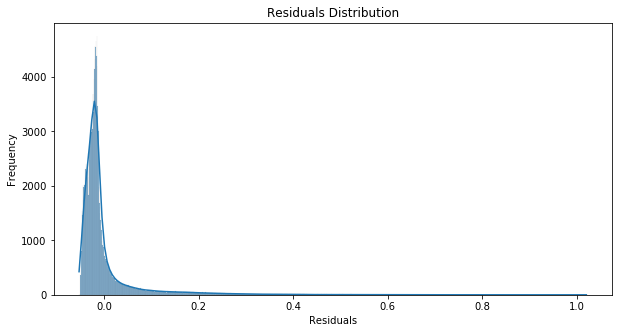

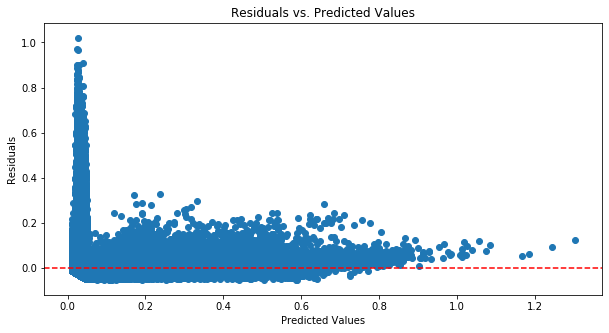

In [107]:
import seaborn as sns

# Calculate residuals
residuals = y_test - y_pred_lr

# Plot residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Plot residuals vs. predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_pred_lr, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()


After analyzing the results of the linear regression, we generated a residual plot which indicated the presence of a non-linear pattern in the data. Given this observation, we have decided to proceed with a non-linear model, specifically the Random Forest model. This approach is expected to capture the complex relationships within the data more effectively, enhancing our predictive capabilities.

In [108]:
#Random Forest

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("\nRandom Forest Regressor Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_rf))
print("R^2 Score:", r2_score(y_test, y_pred_rf))


Random Forest Regressor Performance:
Mean Squared Error: 0.004639400777657848
R^2 Score: 0.7382473200585605


In [21]:
#pip install xgboost

     |████████████████████████████████| 297.1 MB 5.4 MB/s eta 0:00:013    |██████████                      | 92.7 MB 10.4 MB/s eta 0:00:20     |████████████████████████████████| 297.1 MB 20 kB/s 
Note: you may need to restart the kernel to use updated packages.


In [17]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Preprocessing
X = df[['count_car', 'count_motorbike', 'hour', 'weekday']]
y = df['roadOccupancy']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# XGBoost Regressor
xgb_model = XGBRegressor()
xgb_model.fit(X_train_scaled, y_train)
xgb_preds = xgb_model.predict(X_test_scaled)

# Evaluate XGBoost Regressor
xgb_mse = mean_squared_error(y_test, xgb_preds)
print("XGBoost Regressor Mean Squared Error:", xgb_mse)
print("R^2 Score:", r2_score(y_test, xgb_preds))

XGBoost Regressor Mean Squared Error: 0.0037491267616194864
R^2 Score: 0.7580003271101076


In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Hyperparameter distributions for XGBoost Regressor
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0]
}

# RandomizedSearchCV for XGBoost Regressor
xgb_reg = XGBRegressor()
random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist, n_iter=70, cv=3, n_jobs=-1, verbose=2, random_state=42)
random_search.fit(X_train_scaled, y_train)

# Best parameters and performance
best_reg = random_search.best_estimator_

# Predictions and evaluation
y_pred = best_reg.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Best Regressor Parameters:", random_search.best_params_)
print("Regressor Mean Squared Error:", mse)
print("Regressor R^2 Score:", r2)

Fitting 3 folds for each of 70 candidates, totalling 210 fits
Best Regressor Parameters: {'subsample': 0.9, 'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
Regressor Mean Squared Error: 0.0037028047389745236
Regressor R^2 Score: 0.7609903338611295


In [20]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(best_reg, X_train_scaled, y_train, cv=5, scoring='r2')
print("Cross-validated R² scores:", cv_scores)
print("Mean cross-validated R² score:", cv_scores.mean())

Cross-validated R² scores: [0.74506042 0.74798182 0.76399336 0.74839632 0.75145348]
Mean cross-validated R² score: 0.7513770798556376


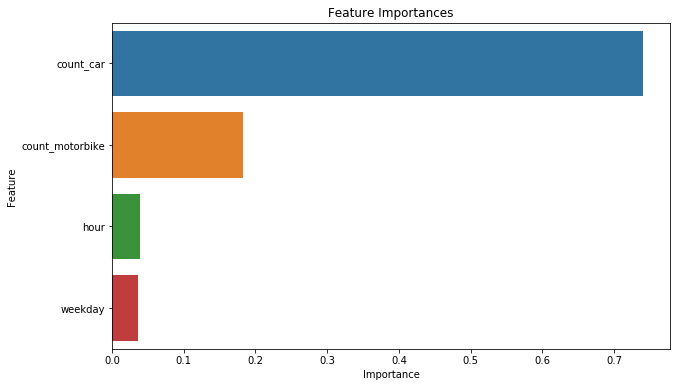

In [19]:
importances = best_reg.feature_importances_
feature_names = X.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

In [9]:
import joblib

# Save the model
joblib.dump(best_reg, '/home/iudx/pari/python/model/xgb_regressor_model_new.pkl')
joblib.dump(scaler, '/home/iudx/pari/python/model/scaler_new.pkl')

In [3]:
#Load new data for prediction

test_df = pd.read_csv("/home/iudx/pari/python/model/pryagraj_traffic_density/traffic_density_test.csv")
test_df = test_df.drop(columns = ['vehicleTypeCount','Unnamed: 0.1','Unnamed: 0','id'])

In [4]:
# Convert observationDateTime which is a string to datetime

test_df['observationDateTime'] = pd.to_datetime(test_df['observationDateTime'])

# Extracting the hour, day, month and weekday  from the Datetime

test_df['hour'] = test_df['observationDateTime'].dt.hour
test_df['day'] = test_df['observationDateTime'].dt.day
test_df['month'] = test_df['observationDateTime'].dt.month
test_df['weekday'] = test_df['observationDateTime'].dt.weekday

In [5]:
test_df = test_df.groupby(['roadID', 'junctionID', 'zoneID', 'hour', 'weekday', 'month']).agg({
    'vehicleCount': 'sum',
    'observationDateTime': 'first',
    'count_car': 'sum',
    'count_truck': 'sum',
    'count_motorbike': 'sum'
}).reset_index()


In [6]:
road_ids = test_df['roadID']
junction_ids = test_df['junctionID']

# Preprocess the new data (exclude the roadID from scaling)
features = test_df[['count_car', 'count_motorbike', 'hour', 'weekday']]

In [36]:
test_df.head()

,roadID,junctionID,zoneID,hour,weekday,month,vehicleCount,observationDateTime,count_car,count_truck,count_motorbike
0,02,J031,2,0,0,6,10.0,2024-06-10 00:10:00+05:30,2,0,8
1,02,J031,2,0,1,6,7.0,2024-06-11 00:00:00+05:30,0,0,7
2,02,J031,2,1,0,6,4.0,2024-06-10 01:05:00+05:30,0,0,4
3,02,J031,2,1,1,6,3.0,2024-06-11 01:20:00+05:30,0,0,3
4,02,J031,2,2,0,6,7.0,2024-06-10 02:30:00+05:30,0,0,7


In [7]:
test_df = test_df.drop_duplicates()

In [10]:
# Load the model and scaler
xgb_model_loaded = joblib.load('/home/iudx/pari/python/model/xgb_regressor_model_new.pkl')
scaler_loaded = joblib.load('/home/iudx/pari/python/model/scaler.pkl')

# New data for prediction (example with 50 packets)

# Extract the roadID for the final output
road_ids = test_df['roadID']
junction_ids = test_df['junctionID']
datetime = test_df['observationDateTime']

# Preprocess the new data (exclude the roadID from scaling)
features = test_df[['count_car', 'count_motorbike', 'hour', 'weekday']]
#features_scaled = scaler_loaded.transform(features)

# Make predictions
predictions = xgb_model_loaded.predict(features)

# Combine the predictions with roadID
output = pd.DataFrame({
    'datetime': datetime,
    'roadID': road_ids,
    'junctionID': junction_ids,
    'roadOccupancy': predictions
})

# Filter the output to get the roadID which have roadOccupancy rate greater than 0.4
#filtered_output = output[output['roadOccupancy'] > 0.6]

#print("Predictions of roadOccupancy > 0.6:")
#print(filtered_output)


In [11]:
output.head()

,datetime,roadID,junctionID,roadOccupancy
0,2024-06-10 00:10:00+05:30,02,J031,0.661676
1,2024-06-11 00:00:00+05:30,02,J031,0.440054
2,2024-06-10 01:05:00+05:30,02,J031,0.376083
3,2024-06-11 01:20:00+05:30,02,J031,0.345971
4,2024-06-10 02:30:00+05:30,02,J031,0.346212


Loading the LineString data for roads in Prayagraj City to create an interactive map that highlights different levels of traffic density across the city.

#### Prepare the lane information from the Prayagraj city

In [13]:
filename = "/home/iudx/pari/python/model/pryagraj_traffic_density/lane_info.csv"
df_lane = pd.read_csv(filename)


In [231]:
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           96 non-null     int64  
 1   carriagewayLength    96 non-null     float64
 2   observationDateTime  96 non-null     object 
 3   junctionID           96 non-null     object 
 4   roadName             96 non-null     object 
 5   id                   96 non-null     object 
 6   roadID               96 non-null     object 
 7   location             96 non-null     object 
dtypes: float64(1), int64(1), object(6)
memory usage: 6.1+ KB


In [44]:
df_lane.head()

,Unnamed: 0,carriagewayLength,observationDateTime,junctionID,roadName,id,roadID,location
0,0,146.76,2024-05-27T17:43:21+05:30,J001,From Minto Park,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L02,"{'type': 'LineString', 'coordinates': [[81.860..."
1,1,140.20,2024-05-27T17:43:21+05:30,J001,From Bangad Tiraha,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L03,"{'coordinates': [[81.86238704543744, 25.439994..."
2,2,134.87,2024-05-27T17:43:21+05:30,J001,From CMP College,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L04,"{'coordinates': [[81.86082977768876, 25.441168..."
3,3,155.94,2024-05-27T17:43:21+05:30,J002,From Chaufatka Chowki,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L01,"{'coordinates': [[81.78100876377292, 25.448600..."
4,4,132.98,2024-05-27T17:43:21+05:30,J002,From Dhoomanganj Police Station,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L02,"{'coordinates': [[81.77969289475932, 25.450382..."


In [14]:
df_lane = df_lane.drop(columns = ['Unnamed: 0','id'])
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   carriagewayLength    96 non-null     float64
 1   observationDateTime  96 non-null     object 
 2   junctionID           96 non-null     object 
 3   roadName             96 non-null     object 
 4   roadID               96 non-null     object 
 5   location             96 non-null     object 
dtypes: float64(1), object(5)
memory usage: 4.6+ KB


In [18]:
import ast

def convert_dict_column(dict_str):
    return ast.literal_eval(dict_str.replace("'", '"'))

# Apply the function to the vehicleTypeCount column
df_lane['location'] = df_lane['location'].apply(convert_dict_column)

# Create a new DataFrame by expanding the dictionary into columns
lane_df = df_lane['location'].apply(pd.Series)

# Rename the columns to include the prefix 'vehicleTypeCount_'
loc_df = lane_df.rename(columns=lambda x: x)
df_lane = pd.concat([df_lane, loc_df], axis=1)


In [216]:
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           96 non-null     int64  
 1   carriagewayLength    96 non-null     float64
 2   observationDateTime  96 non-null     object 
 3   junctionID           96 non-null     object 
 4   roadName             96 non-null     object 
 5   id                   96 non-null     object 
 6   roadID               96 non-null     object 
 7   location             96 non-null     object 
 8   type                 96 non-null     object 
 9   coordinates          96 non-null     object 
dtypes: float64(1), int64(1), object(8)
memory usage: 7.6+ KB


In [19]:
# Function to create GeoJSON features from LineString
from folium import features
from folium.features import DivIcon, GeoJson
from shapely.geometry import LineString
import folium

# Merge the DataFrames on roadID
df_filtered = pd.merge(output, df_lane, on=['junctionID', 'roadID' ])


def create_geojson_feature(coords, color):
    try:
        line = LineString(coords)
        return features.GeoJson(
            data=line.__geo_interface__,
            style_function=lambda x: {'color': color, 'weight': 5}
        )
    except ValueError as e:
        print(f"Error creating LineString: {e}")
        return None

# Initialize a folium map centered at an approximate location
m = folium.Map(location=[25.4358, 81.8463], zoom_start=13)

def get_color(occupancy):
    
    if 0.3 < occupancy <= 0.7:
        return 'blue'
    elif occupancy > 0.7:
        return 'red'
    elif occupancy < 0.3:
        return 'cyan'
    
    #return 'gray'  # Default color for unexpected values

# Add lanes to the map
for _, row in df_filtered.iterrows():
    color = get_color(row['roadOccupancy'])
    geojson_feature = create_geojson_feature(row['coordinates'], color)
    if geojson_feature:
        geojson_feature.add_to(m)

# Display the map
m